In [107]:
import os
from PIL import Image, ImageFile, ImageFilter, ImageDraw

# Image Manipulation

## Creating images


In [50]:
new_image_size = (800, 500)
# 1 for black and white
# 3 for RGB
# L represent grayscale
# RGB : red, green, blue
# RGBA : red, green, blue, alpha (transparency)
# CMYK : cyan, magenta, yellow, black
#YCbCr : luminance, chrominance blue, chrominance red
#I : 32-bit signed integer pixels
#F : 32-bit floating point pixels
new_image = Image.new(mode='RGB', size=new_image_size, color='black')  # in color we can use hex code, rgb, rgba etc
new_image.show()

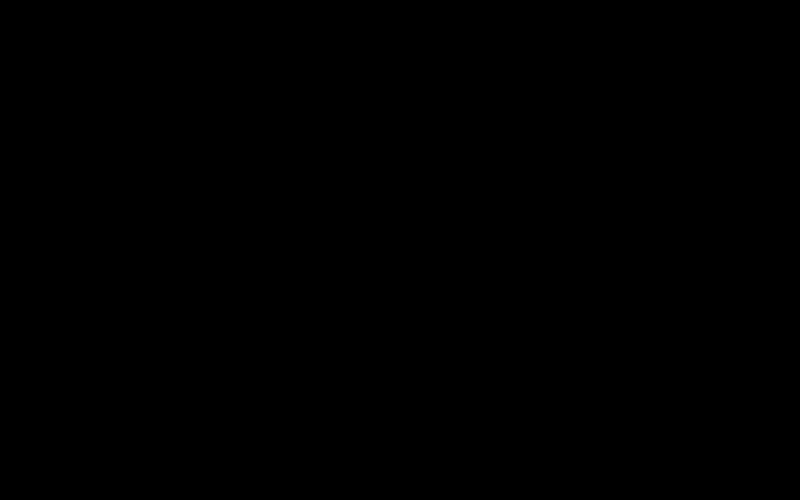

In [51]:
new_image

## Reading, Showing, Resizing, Saving images and filtering images

In [52]:
def show_image(image):
    """
    This will show the image
    :param image: array of image
    :return:
    """
    image.show()


def read_image(image_path):
    """
    This will read the image from the image path
    :param image_path:
    :return:
    """
    image = Image.open(image_path, mode='r')  # We can define the mode such as r=read, w=write, a=append etc
    return image


def save_image(image, save_path):
    image.save(save_path)


def image_type_filter(path):
    images = os.listdir(path)
    images_type = ['jpg', 'png', 'jpeg']
    for i in images:
        for j in images_type:
            if i.endswith(j):
                print(i)


def resize_image(image, image_size=(800, 500)):
    image = image.resize(image_size)
    return image


if __name__ == '__main__':
    ## Reading the image
    image_path = "images/sample_img_copy.jpg"
    simple_img_read = read_image(image_path)
    # show_image(image)
    # save_image(image, "images/sample_img_copy.jpg")

    ## Filtering the image type
    path = "images/"
    image_type_filter(path)

    ## Resizing the image

    resized_image = resize_image(simple_img_read)
    # show_image(image)


shape.png
rectangle.png
sample_img_copy.jpg
ss.png
sample_noise.png
sample_img.jpg


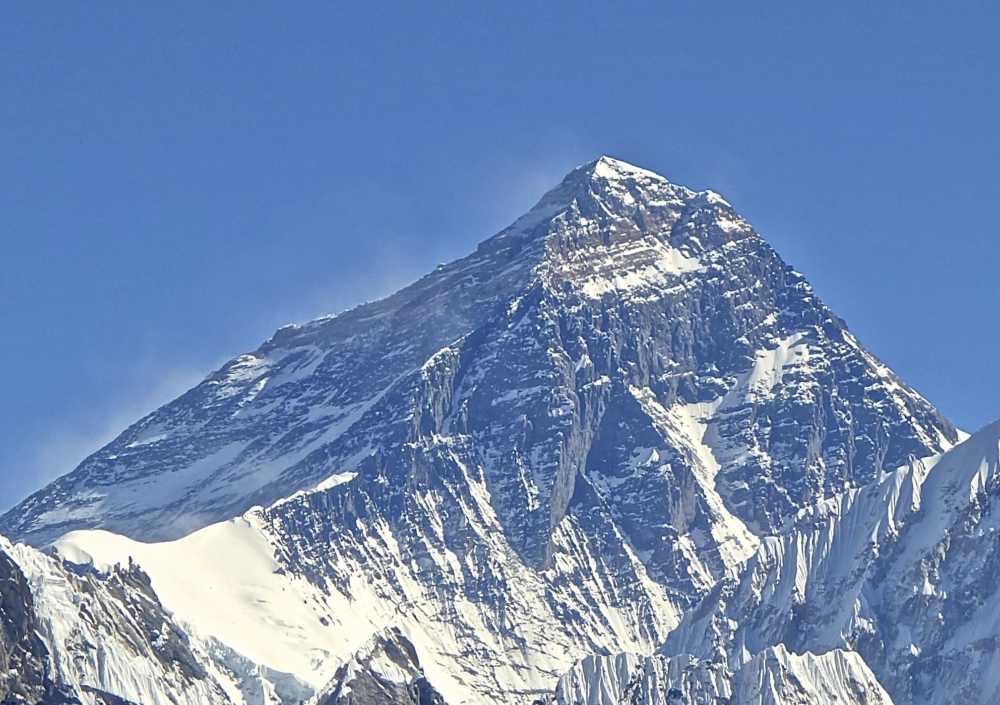

In [53]:
simple_img_read

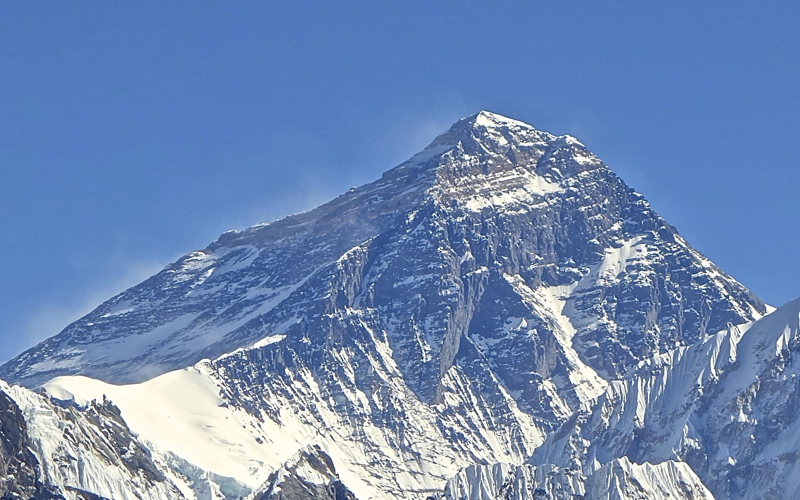

In [54]:
resized_image

## Blending and Compositing
- Blending is the process of combining two images of the same size to create a new imgage.
- Composition is the process of combining two images of the same size with a mask to create a new image.

In [62]:
def blend_image(image1, image2, alpha):
    blended_image = Image.blend(image1, image2, alpha)
    return blended_image


image1 = Image.open("images/sample_img2.jpg")
image2 = Image.open("images/sample_img3.jpg")
image1_resized = resize_image(image1, image_size=(800, 500))
image2_resized = resize_image(image2, image_size=(800, 500))

blended_image = blend_image(image1_resized, image2_resized,
                            alpha=0.9)  # Here alpha is the transparency of the image if we increase the alpha value the image will be more transparent


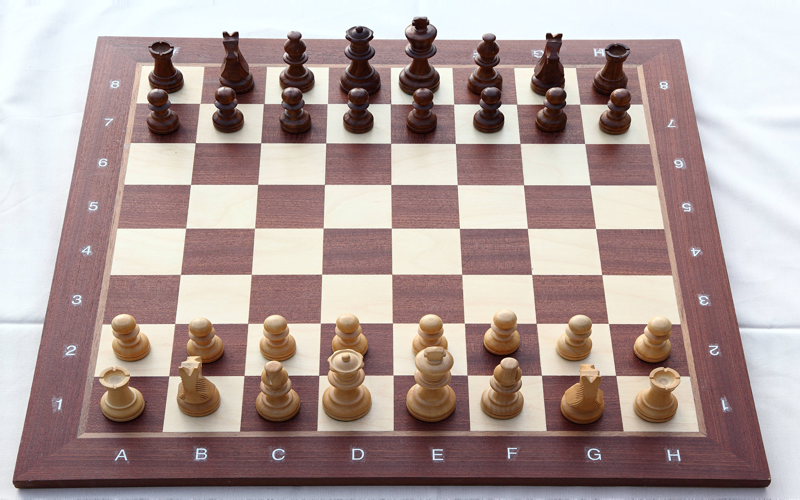

In [63]:
image1_resized

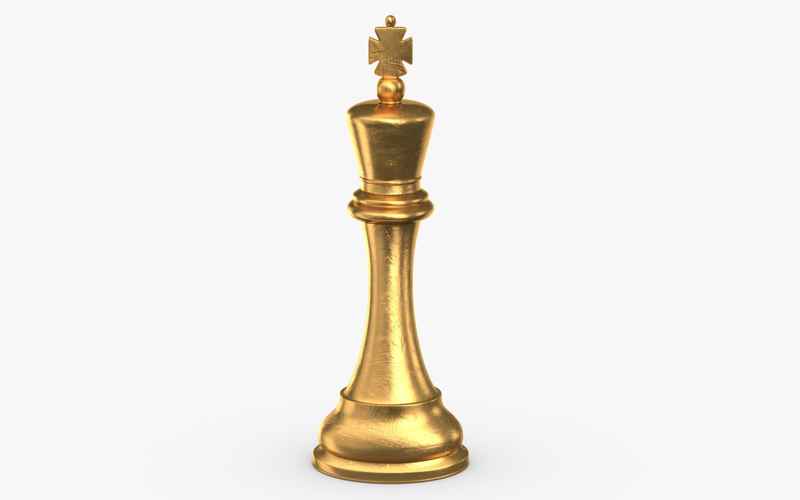

In [64]:
image2_resized

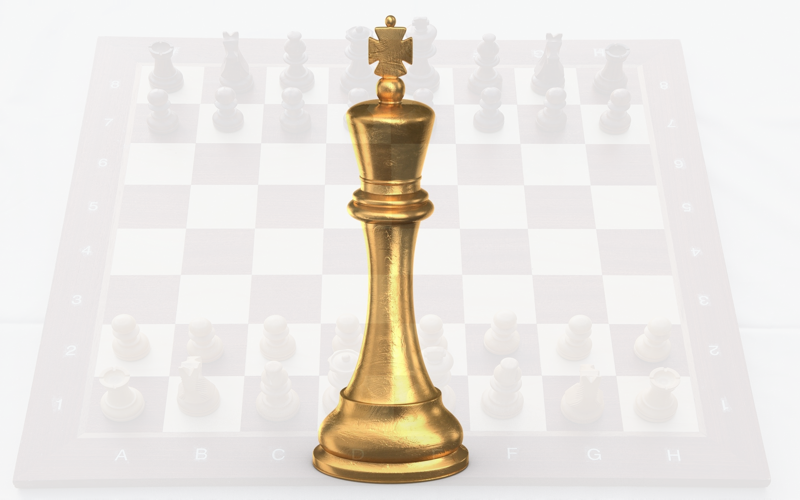

In [65]:
blended_image

In [81]:
def composite_image(image1, image2, mask_image):
    Image.composite(image1, image2, mask=mask_image)
    return image1

In [102]:
image2 = Image.open("images/group1/basketball.jpg")
image1 = Image.open("images/group1/football.png")
mask_image = Image.open("images/group1/basketball_mask.jpg")
image1_resized = resize_image(image1, image_size=(500, 500))
image2_resized = resize_image(image2, image_size=(500, 500))

mask_image_resized = resize_image(mask_image, image_size=(500, 500))

composited_image = composite_image(image1=image1_resized, image2=image2_resized, mask_image=mask_image_resized)

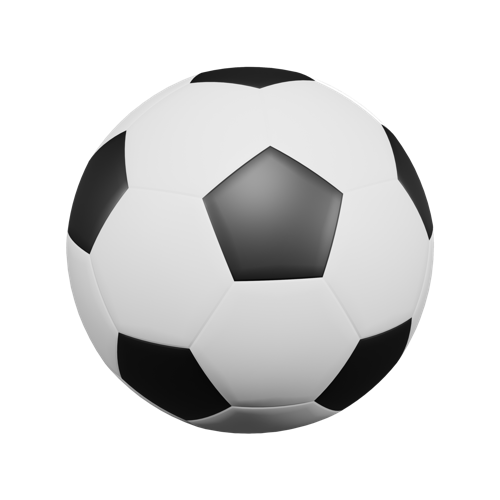

In [103]:
image1_resized

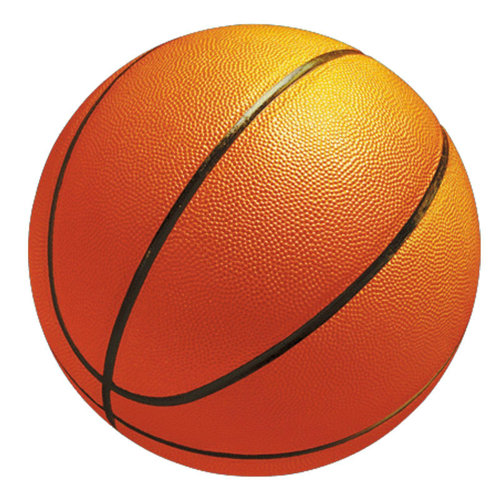

In [104]:
image2_resized

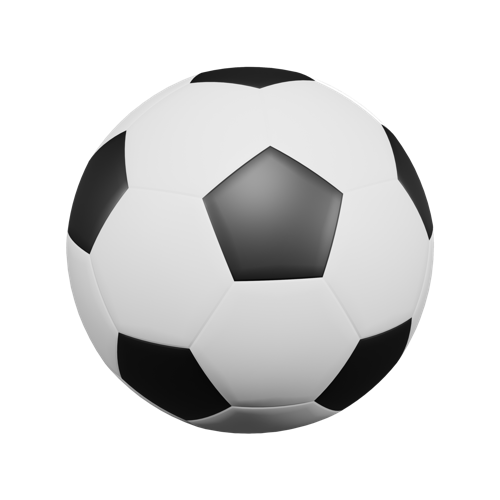

In [105]:
composited_image

## Rotation,Filtering,GetColors,GetPixel,GetData

## 

In [23]:
def rotate_image(image, angle):
    image = image.rotate(angle)
    return image


rotated_image = rotate_image(simple_img_read, 90)

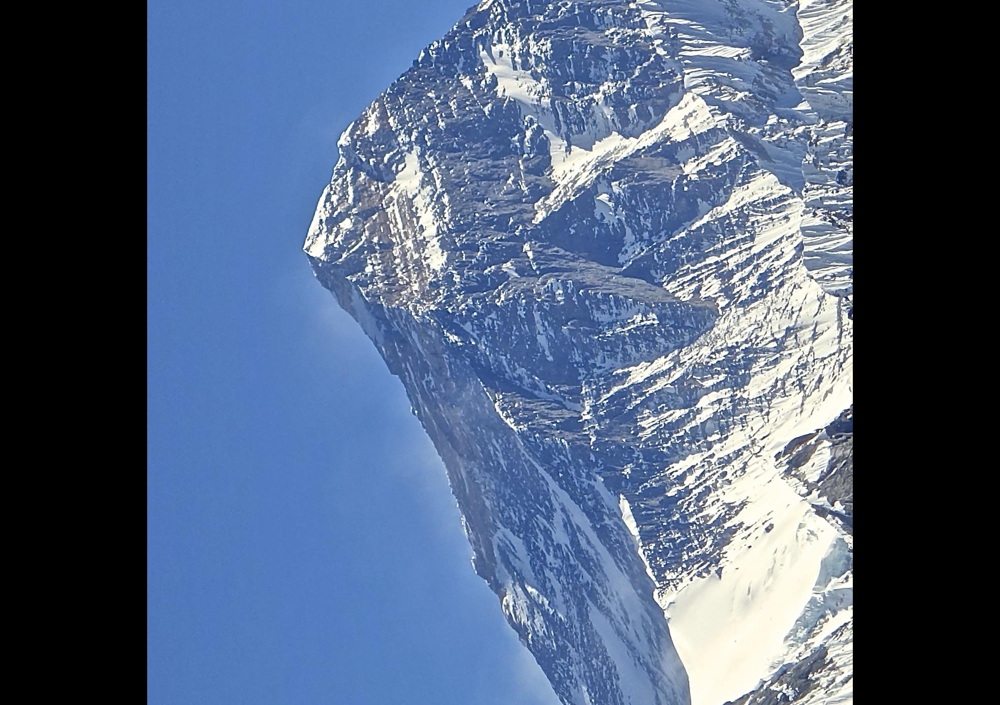

In [24]:
rotated_image

## Black and white

In [55]:
black_white_image = resized_image.convert('L')

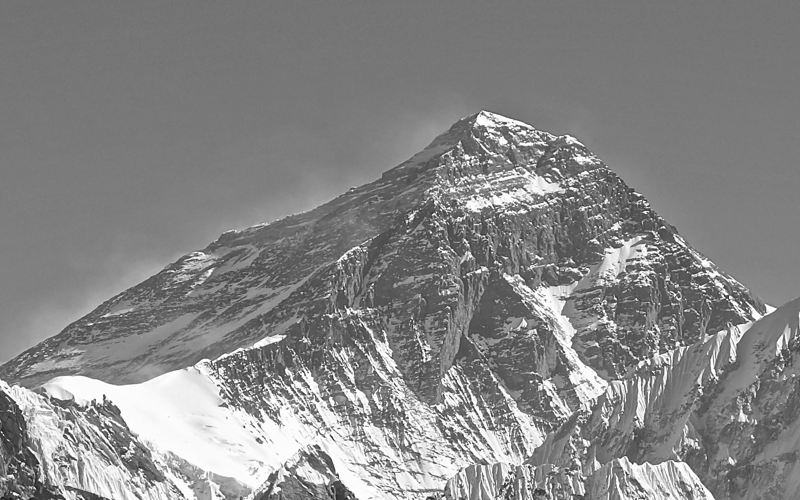

In [56]:
black_white_image

## Filtering the image


In [121]:
def image_filter(image):
    image = image.filter(
        ImageFilter.FIND_EDGES)  # Here we can use different filters such as BLUR, CONTOUR, DETAIL, EDGE_ENHANCE, EDGE_ENHANCE_MORE, EMBOSS, FIND_EDGES, SHARPEN, SMOOTH, SMOOTH_MORE 
    return image


image_filter_try_image = Image.open("images/sample_img.jpg")
image_filter_try_image = resize_image(image_filter_try_image, image_size=(800, 500))
image_filter_try_image = image_filter(image_filter_try_image)

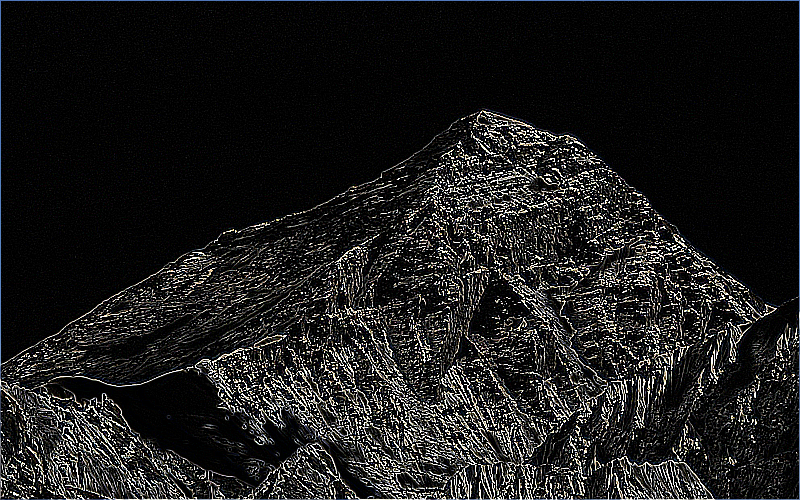

In [122]:
image_filter_try_image

## Image Size

In [125]:
image_size_try = image_filter_try_image.copy()
w, h = image_size_try.size
w, h

(800, 500)

## Get Colors

In [134]:
# This will return the colors of each pixel in the image
image_get_color_try = image_filter_try_image.copy()
width, height = image_get_color_try.size
colors = image_get_color_try.getcolors(width * height)
colors[0]

(89, (10, 0, 0))

## Get Pixel

In [131]:
get_pixel_try_image = image_filter_try_image.copy()
width, height = get_pixel_try_image.size
pixel = get_pixel_try_image.getpixel((width // 2, height // 2))
pixel

(205, 206, 204)

In [135]:
#Get pixel will be slow for large images so we will use getdata

get_data_try_image = image_filter_try_image.copy()
data = get_data_try_image.getdata()
list(data[0])

[78, 117, 184]

## Merging Images


In [142]:
merge_try_image1 = Image.open("images/sample_img2.jpg")
merge_try_image2 = Image.open("images/sample_img3.jpg")
merge_try_image1 = resize_image(merge_try_image1, image_size=(800, 500))
merge_try_image2 = resize_image(merge_try_image2, image_size=(800, 500))

w, h = merge_try_image1.size
w1, h1 = merge_try_image2.size
w, h = w1 + w, h + h1
new_image = Image.new('RGB', (w, h))
new_image.paste(merge_try_image1)
new_image.paste(merge_try_image2, (w1, h1))

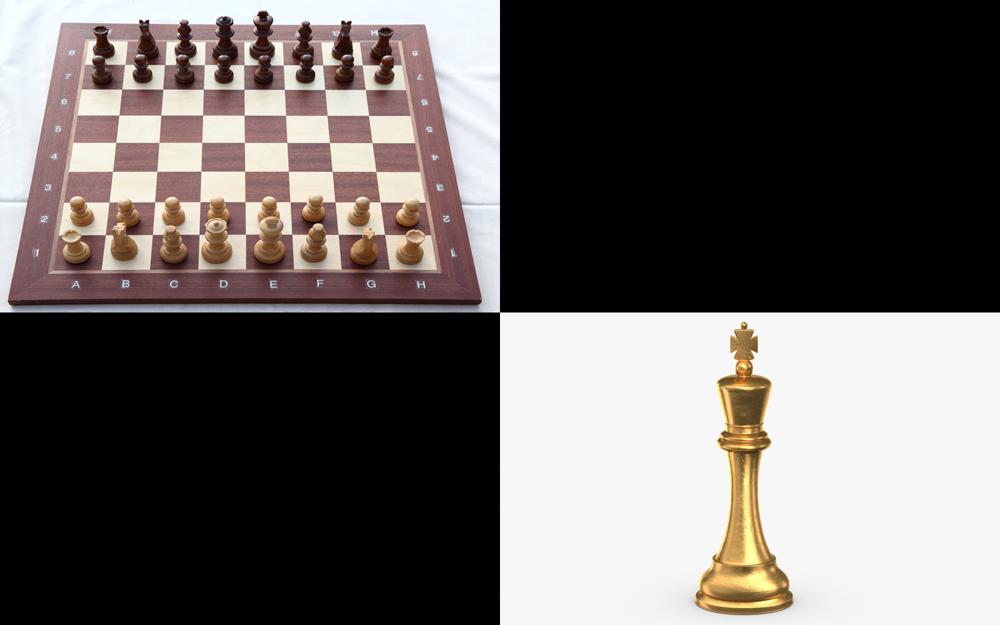

In [143]:
new_image

## Cropping Images

In [152]:
crop_try_image = image_filter_try_image.copy()
w,h=crop_try_image.size
left = 100
top = 100
right = 400
bottom = 3*h//4
crop_try_image = crop_try_image.crop((left, top, right, bottom))

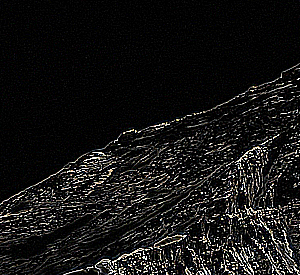

In [153]:
crop_try_image

## Drawing on Images

In [162]:
draw_try_image = image_filter_try_image.copy()
draw = ImageDraw.Draw(draw_try_image)
draw.line((10, 0) + draw_try_image.size, fill=120)
draw.text((10, 10), "Hello World", fill=128,font_size=102)

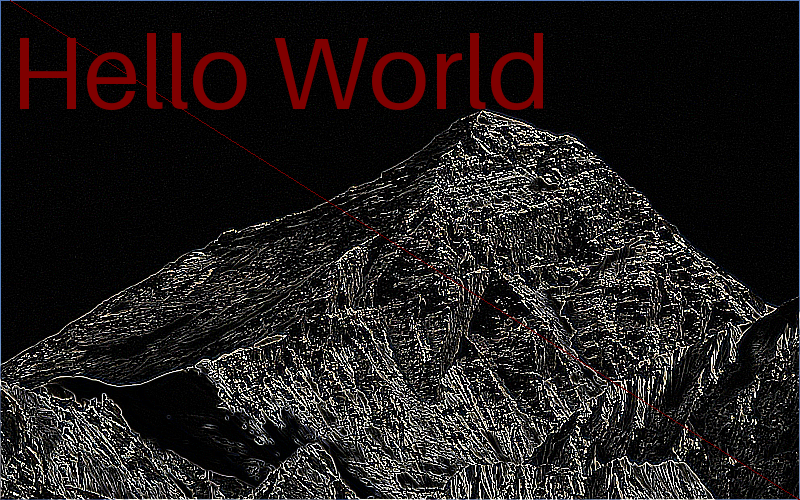

In [163]:
draw_try_image

## Image alteration

In [168]:
image_alteration_try = image_filter_try_image.copy()
image_alteration_try = image_alteration_try.transpose(Image.FLIP_LEFT_RIGHT)

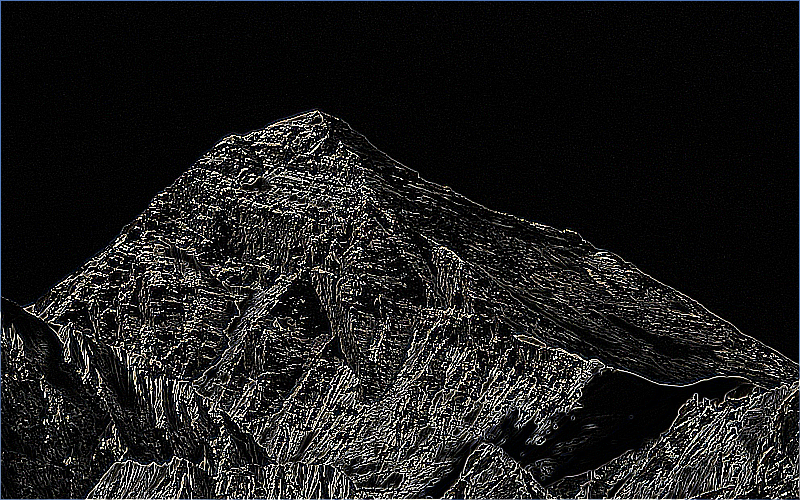

In [169]:
image_alteration_try